In [1]:
import numpy as np
x1 = np.array([2,4,2])
x2 = np.array([8,2,10])
x3 = np.array([12,16,12])
print("Row 1:", x1, sep="\n")
print("Row 2:", x2, sep="\n")
print("Row 3:", x3, sep="\n")

Row 1:
[2 4 2]
Row 2:
[ 8  2 10]
Row 3:
[12 16 12]


In [2]:
x1 = np.matrix(x1)
x2 = np.matrix(x2)
x3 = np.matrix(x3)
print(x1, sep="\n")
print(x2, sep="\n")
print(x3, sep="\n")

[[2 4 2]]
[[ 8  2 10]]
[[12 16 12]]


In [3]:
X = np.concatenate((x1, x2, x3), axis = 0)
print("X:", X, sep = "\n")

X:
[[ 2  4  2]
 [ 8  2 10]
 [12 16 12]]


In [4]:
x_inverse = X.getI()
print("X Inverse:", x_inverse, sep = "\n")

X Inverse:
[[-4.2500000e+00 -5.0000000e-01  1.1250000e+00]
 [ 7.5000000e-01 -3.8430797e-17 -1.2500000e-01]
 [ 3.2500000e+00  5.0000000e-01 -8.7500000e-01]]


In [5]:
x_inverse = np.round(X.getI(),2)
print("X Inverse:",
     x_inverse,
     sep = "\n")

X Inverse:
[[-4.25 -0.5   1.12]
 [ 0.75 -0.   -0.12]
 [ 3.25  0.5  -0.87]]


In [6]:
import pandas as pd
import statsmodels.api as sm
import numpy as np

data = pd.read_csv("fraseDataWithRGDPPC.csv", index_col = [0,1], parse_dates = True)
data

EFW  Size of Government  \
ISO_Code Year                                       
ALB      2017-01-01  7.673511            7.528167   
         2016-01-01  7.637742            7.875862   
         2015-01-01  7.639666            7.904257   
         2014-01-01  7.586769            7.882037   
         2013-01-01  7.389525            7.807904   
...                       ...                 ...   
ZWE      2000-01-01  4.299839            5.365058   
         1995-01-01  5.518614            6.418859   
         1990-01-01  4.516140            5.108843   
         1985-01-01  4.226841            5.026250   
         1980-01-01  4.054740            6.322625   

                     Legal System & Property Rights  Sound Money  \
ISO_Code Year                                                      
ALB      2017-01-01                        5.064907     9.648271   
         2016-01-01                        5.071814     9.553657   
         2015-01-01                        5.003489     9.585625   
         2014-01-01                        4.666740     9.629320   
         2013-01-01                        4.543782     9.690942   
...                                             ...          ...   
ZWE      2000-01-01                        4.662445     2.891166   
         1995-01-01                        5.138131     4.915293   
         1990-01-01                        3.439437     5.664840   
         1985-01-01                        2.633492     6.305850   
         1980-01-01                        1.379602     6.343342   

                     Freedom to trade internationally  Regulation  \
ISO_Code Year                                                       
ALB      2017-01-01                          8.343863    7.782349   
         2016-01-01                          8.214900    7.472476   
         2015-01-01                          8.109118    7.595838   
         2014-01-01                          8.208630    7.547119   
         2013-01-01                          7.705771    7.199224   
...                                               ...         ...   
ZWE      2000-01-01                          3.224735    5.355792   
         1995-01-01                          5.839664    5.423290   
         1990-01-01                          4.689623    3.953668   
         1985-01-01                          3.161743    4.207229   
         1980-01-01                          3.277015    3.280637   

                     RGDP Per Capita  
ISO_Code Year                         
ALB      2017-01-01              NaN  
         2016-01-01          10342.0  
         2015-01-01          10032.0  
         2014-01-01           9808.0  
         2013-01-01           9660.0  
...                              ...  
ZWE      2000-01-01           2249.0  
         1995-01-01           2156.0  
         1990-01-01           2232.0  
         1985-01-01           2198.0  
         1980-01-01           2133.0  

[3030 rows x 7 columns]

In [7]:
years = np.array(sorted(list(set(data.index.get_level_values("Year")))))
years = pd.date_range(years[0],
                      years[-2],
                      freq = "AS")
countries = sorted(list(set(data.index.get_level_values("ISO_Code"))))
index_names = list(data.index.names)
multi_index = pd.MultiIndex.from_product([countries,
                                          years[:-1]],
                                         names = data.index.names)
data = data.reindex(multi_index)

data

EFW  Size of Government  \
ISO_Code Year                                       
AGO      1970-01-01       NaN                 NaN   
         1971-01-01       NaN                 NaN   
         1972-01-01       NaN                 NaN   
         1973-01-01       NaN                 NaN   
         1974-01-01       NaN                 NaN   
...                       ...                 ...   
ZWE      2011-01-01  4.843441            6.424630   
         2012-01-01  4.971192            6.670469   
         2013-01-01  5.246723            6.325105   
         2014-01-01  5.582478            6.433165   
         2015-01-01  6.145330            6.402772   

                     Legal System & Property Rights  Sound Money  \
ISO_Code Year                                                      
AGO      1970-01-01                             NaN          NaN   
         1971-01-01                             NaN          NaN   
         1972-01-01                             NaN          NaN   
         1973-01-01                             NaN          NaN   
         1974-01-01                             NaN          NaN   
...                                             ...          ...   
ZWE      2011-01-01                        3.943725     4.109198   
         2012-01-01                        4.013004     5.378742   
         2013-01-01                        3.575827     6.895530   
         2014-01-01                        3.615584     7.966798   
         2015-01-01                        3.820360     8.180178   

                     Freedom to trade internationally  Regulation  \
ISO_Code Year                                                       
AGO      1970-01-01                               NaN         NaN   
         1971-01-01                               NaN         NaN   
         1972-01-01                               NaN         NaN   
         1973-01-01                               NaN         NaN   
         1974-01-01                               NaN         NaN   
...                                               ...         ...   
ZWE      2011-01-01                          5.366773    4.372878   
         2012-01-01                          5.132305    3.661438   
         2013-01-01                          5.589087    3.848068   
         2014-01-01                          5.909121    3.987721   
         2015-01-01                          5.679719    6.643620   

                     RGDP Per Capita  
ISO_Code Year                         
AGO      1970-01-01              NaN  
         1971-01-01              NaN  
         1972-01-01              NaN  
         1973-01-01              NaN  
         1974-01-01              NaN  
...                              ...  
ZWE      2011-01-01           1515.0  
         2012-01-01           1604.0  
         2013-01-01           1604.0  
         2014-01-01           1594.0  
         2015-01-01           1560.0  

[7452 rows x 7 columns]

In [8]:
data["RGDP Per Capita Lag"] = data.groupby("ISO_Code")["RGDP Per Capita"].shift()

In [9]:
data = data.dropna(axis=0)
data.loc["GBR"]

,EFW,Size of Government,Legal System & Property Rights,Sound Money,Freedom to trade internationally,Regulation,RGDP Per Capita,RGDP Per Capita Lag
Year,,,,,,,,
2001-01-01,8.452018,6.961156,8.234602,9.520818,9.231009,8.312506,32356.0,31619.0
2002-01-01,8.490705,7.139978,8.144261,9.484984,9.161324,8.522978,32992.0,32356.0
2003-01-01,8.499127,7.039513,8.245855,9.414910,9.236219,8.559139,33977.0,32992.0
2004-01-01,8.382597,6.920611,8.069173,9.426507,8.908917,8.587775,34638.0,33977.0
2005-01-01,8.393285,6.922756,8.265496,9.449126,8.786506,8.542543,35424.0,34638.0
2006-01-01,8.302836,6.914460,7.982602,9.395209,8.748802,8.473108,36045.0,35424.0
2007-01-01,8.192020,6.929650,7.644268,9.435705,8.686429,8.264048,36679.0,36045.0
2008-01-01,8.025975,6.161823,7.807282,9.406692,8.600234,8.153843,36163.0,36679.0
2009-01-01,8.010150,6.282977,7.979651,9.499708,8.744129,7.544287,34338.0,36163.0


In [10]:
y_var = ["RGDP Per Capita"]
x_vars = ["Size of Government", 
          "Legal System & Property Rights", 
          "Sound Money",
          "Freedom to trade internationally",
          "Regulation"]
reg_vars = y_var + x_vars
reg_data = data[reg_vars]
reg_data.corr().round(2)

,RGDP Per Capita,Size of Government,Legal System & Property Rights,Sound Money,Freedom to trade internationally,Regulation
RGDP Per Capita,1.00,-0.24,0.67,0.44,0.51,0.51
Size of Government,-0.24,1.00,-0.17,0.11,0.14,0.08
Legal System & Property Rights,0.67,-0.17,1.00,0.59,0.68,0.66
Sound Money,0.44,0.11,0.59,1.00,0.75,0.57
Freedom to trade internationally,0.51,0.14,0.68,0.75,1.00,0.65
Regulation,0.51,0.08,0.66,0.57,0.65,1.00


In [11]:
y = reg_data[y_var]
X = reg_data[x_vars]
X["Constant"] = 1
results = sm.OLS(y, X).fit()

In [12]:
predictor = results.predict()
reg_data[y_var[0] + " Predictor"] = predictor
reg_data

<ipython-input-12-a770ddb4f4be>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data[y_var[0] + " Predictor"] = predictor


RGDP Per Capita  Size of Government  \
ISO_Code Year                                              
AGO      2006-01-01           6024.0            5.342913   
         2007-01-01           7173.0            5.239228   
         2008-01-01           7936.0            5.307379   
         2009-01-01           7900.0            7.104953   
         2010-01-01           7940.0            5.738678   
...                              ...                 ...   
ZWE      2011-01-01           1515.0            6.424630   
         2012-01-01           1604.0            6.670469   
         2013-01-01           1604.0            6.325105   
         2014-01-01           1594.0            6.433165   
         2015-01-01           1560.0            6.402772   

                     Legal System & Property Rights  Sound Money  \
ISO_Code Year                                                      
AGO      2006-01-01                        3.546463     4.061198   
         2007-01-01                        3.569182     4.453327   
         2008-01-01                        3.654098     5.032836   
         2009-01-01                        3.622792     5.238259   
         2010-01-01                        3.672884     5.570226   
...                                             ...          ...   
ZWE      2011-01-01                        3.943725     4.109198   
         2012-01-01                        4.013004     5.378742   
         2013-01-01                        3.575827     6.895530   
         2014-01-01                        3.615584     7.966798   
         2015-01-01                        3.820360     8.180178   

                     Freedom to trade internationally  Regulation  \
ISO_Code Year                                                       
AGO      2006-01-01                          6.158949    5.306135   
         2007-01-01                          6.115462    5.524626   
         2008-01-01                          5.687976    5.221726   
         2009-01-01                          5.811844    5.011598   
         2010-01-01                          6.189831    5.692320   
...                                               ...         ...   
ZWE      2011-01-01                          5.366773    4.372878   
         2012-01-01                          5.132305    3.661438   
         2013-01-01                          5.589087    3.848068   
         2014-01-01                          5.909121    3.987721   
         2015-01-01                          5.679719    6.643620   

                     RGDP Per Capita Predictor  
ISO_Code Year                                   
AGO      2006-01-01                5888.936630  
         2007-01-01                6938.646269  
         2008-01-01                5820.385195  
         2009-01-01                -559.344439  
         2010-01-01                6752.189724  
...                                        ...  
ZWE      2011-01-01                 576.274207  
         2012-01-01               -1574.968350  
         2013-01-01                -786.788053  
         2014-01-01                 394.254808  
         2015-01-01                7553.916466  

[1999 rows x 7 columns]

In [13]:
y_hat = reg_data[y_var[0] + " Predictor"]
y_mean = reg_data[y_var[0]].mean()
y = reg_data[y_var[0]]
reg_data["Residuals"] = (y_hat.sub(y_mean))
reg_data["Squared Residuals"] = reg_data["Residuals"].pow(2)
reg_data["Squared Errors"] = (y.sub(y_hat)) ** 2
reg_data["Squared Totals"] = (y.sub(y_mean)) ** 2
reg_data

RGDP Per Capita  Size of Government  \
ISO_Code Year                                              
AGO      2006-01-01           6024.0            5.342913   
         2007-01-01           7173.0            5.239228   
         2008-01-01           7936.0            5.307379   
         2009-01-01           7900.0            7.104953   
         2010-01-01           7940.0            5.738678   
...                              ...                 ...   
ZWE      2011-01-01           1515.0            6.424630   
         2012-01-01           1604.0            6.670469   
         2013-01-01           1604.0            6.325105   
         2014-01-01           1594.0            6.433165   
         2015-01-01           1560.0            6.402772   

                     Legal System & Property Rights  Sound Money  \
ISO_Code Year                                                      
AGO      2006-01-01                        3.546463     4.061198   
         2007-01-01                        3.569182     4.453327   
         2008-01-01                        3.654098     5.032836   
         2009-01-01                        3.622792     5.238259   
         2010-01-01                        3.672884     5.570226   
...                                             ...          ...   
ZWE      2011-01-01                        3.943725     4.109198   
         2012-01-01                        4.013004     5.378742   
         2013-01-01                        3.575827     6.895530   
         2014-01-01                        3.615584     7.966798   
         2015-01-01                        3.820360     8.180178   

                     Freedom to trade internationally  Regulation  \
ISO_Code Year                                                       
AGO      2006-01-01                          6.158949    5.306135   
         2007-01-01                          6.115462    5.524626   
         2008-01-01                          5.687976    5.221726   
         2009-01-01                          5.811844    5.011598   
         2010-01-01                          6.189831    5.692320   
...                                               ...         ...   
ZWE      2011-01-01                          5.366773    4.372878   
         2012-01-01                          5.132305    3.661438   
         2013-01-01                          5.589087    3.848068   
         2014-01-01                          5.909121    3.987721   
         2015-01-01                          5.679719    6.643620   

                     RGDP Per Capita Predictor     Residuals  \
ISO_Code Year                                                  
AGO      2006-01-01                5888.936630 -11983.891784   
         2007-01-01                6938.646269 -10934.182145   
         2008-01-01                5820.385195 -12052.443219   
         2009-01-01                -559.344439 -18432.172853   
         2010-01-01                6752.189724 -11120.638690   
...                                        ...           ...   
ZWE      2011-01-01                 576.274207 -17296.554207   
         2012-01-01               -1574.968350 -19447.796764   
         2013-01-01                -786.788053 -18659.616468   
         2014-01-01                 394.254808 -17478.573606   
         2015-01-01                7553.916466 -10318.911949   

                     Squared Residuals  Squared Errors  Squared Totals  
ISO_Code Year                                                           
AGO      2006-01-01       1.436137e+08    1.824211e+04    1.403947e+08  
         2007-01-01       1.195563e+08    5.492167e+04    1.144863e+08  
         2008-01-01       1.452614e+08    4.475826e+06    9.874056e+07  
         2009-01-01       3.397450e+08    7.156051e+07    9.945731e+07  
         2010-01-01       1.236686e+08    1.410893e+06    9.866108e+07  
...                                ...             ...             ...  
ZWE      2011-01-01       2.991708e+08  

In [14]:
SSR = reg_data["Squared Residuals"].sum()
SSE = reg_data["Squared Errors"].sum()
SST = reg_data["Squared Totals"].sum()
SSR,SSE,SST

(358868313273.4213, 369184927866.725, 728053241140.146)

In [15]:
n = results.nobs
k = len(results.params)
estimator_variance = SSE / (n - k)
n, k, estimator_variance

(1999.0, 6, 185240806.75701204)

In [16]:
cov_matrix = results.cov_params()
cov_matrix

,Size of Government,Legal System & Property Rights,Sound Money,Freedom to trade internationally,Regulation,Constant
Size of Government,90663.347889,34051.247307,-5598.363714,-29588.668329,-17544.772554,-3.965366e+05
Legal System & Property Rights,34051.247307,83719.625982,-10982.229986,-48004.526989,-47842.818213,9.234979e+04
Sound Money,-5598.363714,-10982.229986,95441.443937,-73446.912532,-12488.226102,-6.629652e+04
Freedom to trade internationally,-29588.668329,-48004.526989,-73446.912532,212439.135506,-42703.701572,-1.790723e+05
Regulation,-17544.772554,-47842.818213,-12488.226102,-42703.701572,180706.821842,-4.665628e+05
Constant,-396536.606542,92349.787790,-66296.524283,-179072.303933,-466562.804566,7.199304e+06


In [17]:
results.params

Size of Government                  -3352.865866
Legal System & Property Rights       5137.798603
Sound Money                           368.803686
Freedom to trade internationally     1904.124509
Regulation                           2396.090634
Constant                           -20357.173685
dtype: float64

In [18]:
parameters = {}
for x_var in x_vars:
    parameters[x_var] = {}
    parameters[x_var]["Beta"] = results.params[x_var]
    parameters[x_var]["Standard Error"] = cov_matrix.loc[x_var, x_var] ** (1/2)
    parameters[x_var]["t-stats"] = parameters[x_var]["Beta"] / parameters[x_var]["Standard Error"] 
parameters = pd.DataFrame(parameters).T
parameters

,Beta,Standard Error,t-stats
Size of Government,-3352.865866,301.103550,-11.135259
Legal System & Property Rights,5137.798603,289.343440,17.756748
Sound Money,368.803686,308.935987,1.193787
Freedom to trade internationally,1904.124509,460.911201,4.131218
Regulation,2396.090634,425.096250,5.636584


In [19]:
r2 = SSR/SST
r2

0.49291493120946256

In [20]:
r2_adjusted = 1 - (SSE / (n-k)) / (SST / (n-1))
r2_adjusted

0.4916427659591096

In [21]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        RGDP Per Capita   R-squared:                       0.493
Model:                            OLS   Adj. R-squared:                  0.492
Method:                 Least Squares   F-statistic:                     387.5
Date:                Tue, 26 Oct 2021   Prob (F-statistic):          1.07e-290
Time:                        20:15:14   Log-Likelihood:                -21861.
No. Observations:                1999   AIC:                         4.373e+04
Df Residuals:                    1993   BIC:                         4.377e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Size of Government               -3352.8659    301.104    -11.135      0.000   -3943.377   -2762.355
Legal System & Property Rights    5137.7986    289.343     17.757      0.000    4570.351    5705.246
Sound Money                        368.8037    308.936      1.194      0.233    -237.068     974.675
Freedom to trade internationally  1904.1245    460.911      4.131      0.000    1000.206    2808.043
Regulation                        2396.0906    425.096      5.637      0.000    1562.411    3229.770
Constant                         -2.036e+04   2683.152     -7.587      0.000   -2.56e+04   -1.51e+04
==============================================================================
Omnibus:                     1644.254   Durbin-Watson:                   0.230
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            55398.326
Skew:                           3.668   Prob(JB):                         0.00
Kurtosis:                      27.724   Cond. No.                         137.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

(array([-40000., -20000.,      0.,  20000.,  40000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

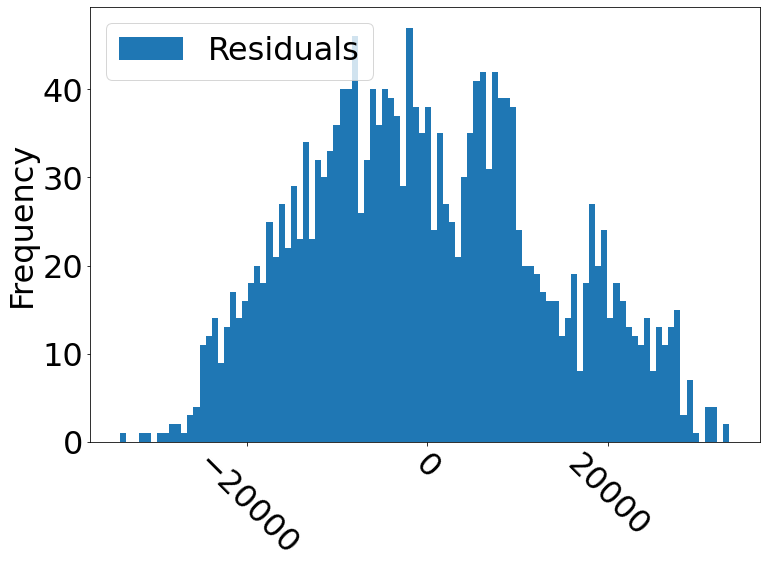

In [22]:
import matplotlib.pyplot as plt
plt.rcParams.update({"font.size":32})
fig, ax = plt.subplots(figsize = (12,8))
reg_data[["Residuals"]].plot.hist(bins = 100,
                                 ax = ax)
plt.xticks(rotation = -45)

<AxesSubplot:ylabel='Frequency'>

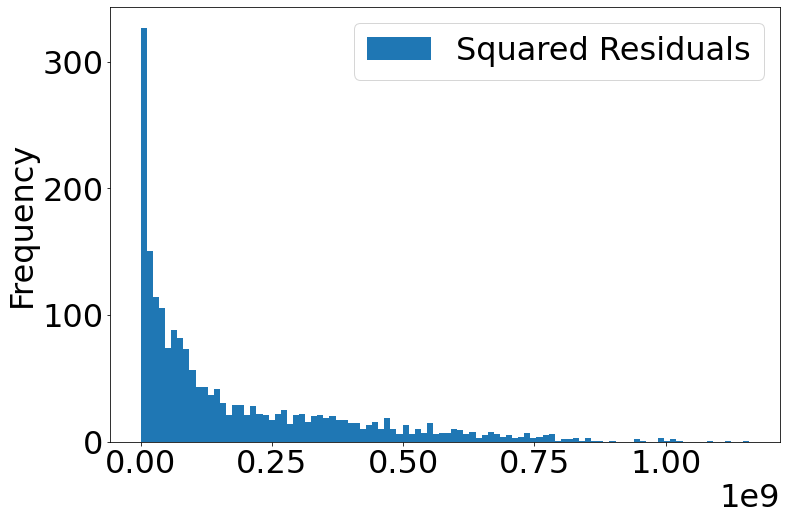

In [23]:
fig, ax = plt.subplots(figsize = (12,8))
reg_data[["Squared Residuals"]].plot.hist(bins = 100,
                                         ax = ax)

<ipython-input-24-0880ac3ccef3>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize = (12,8))
C:\Users\ADMIN\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:1167: UserWarning: Attempting to set identical left == right == 45.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
C:\Users\ADMIN\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:1167: UserWarning: Attempting to set identical left == right == 45.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
C:\Users\ADMIN\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:1167: UserWarning: Attempting to set identical left == right == 45.0 results in singular transformat

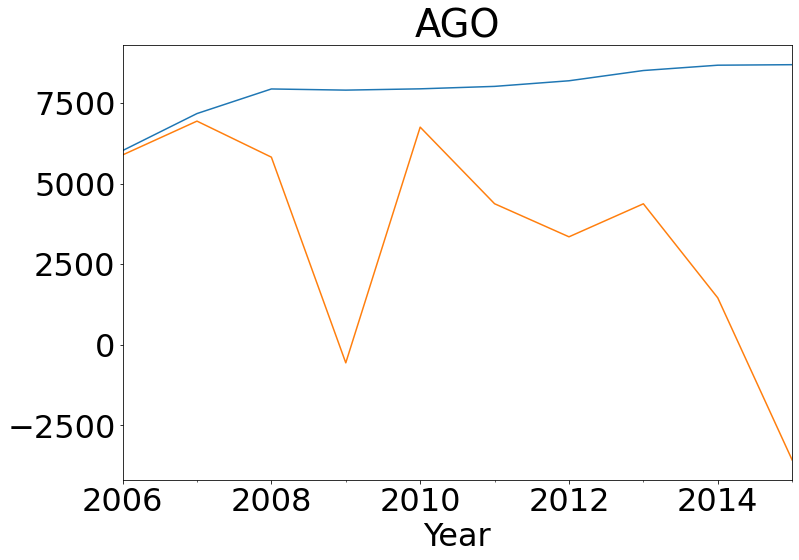

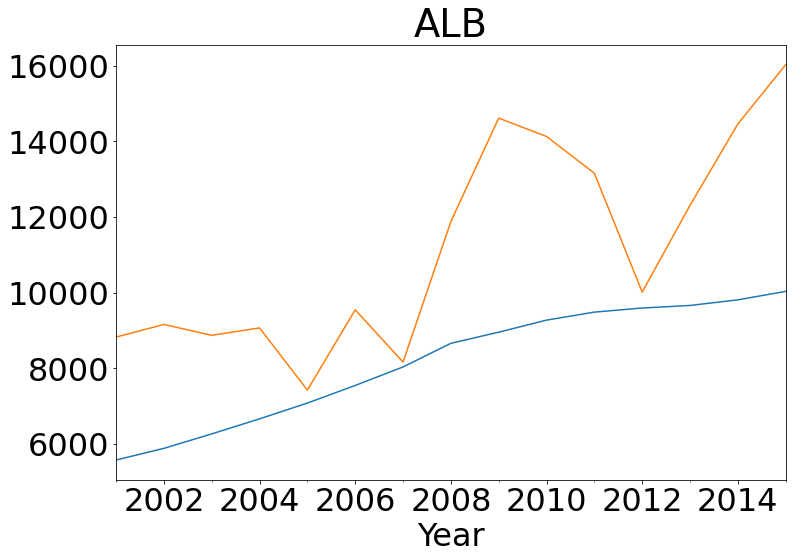

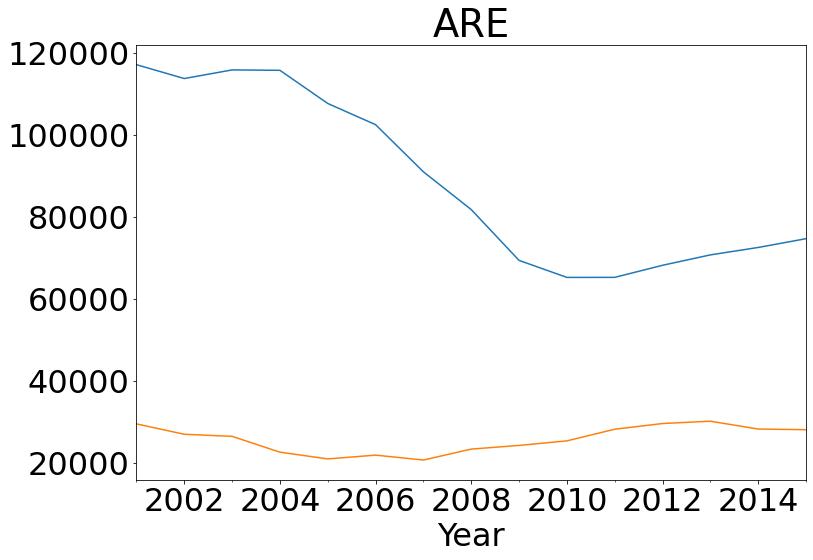

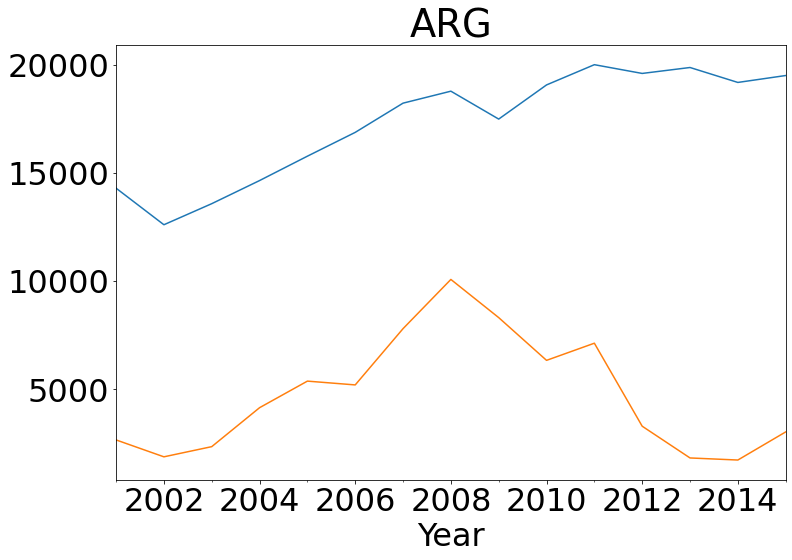

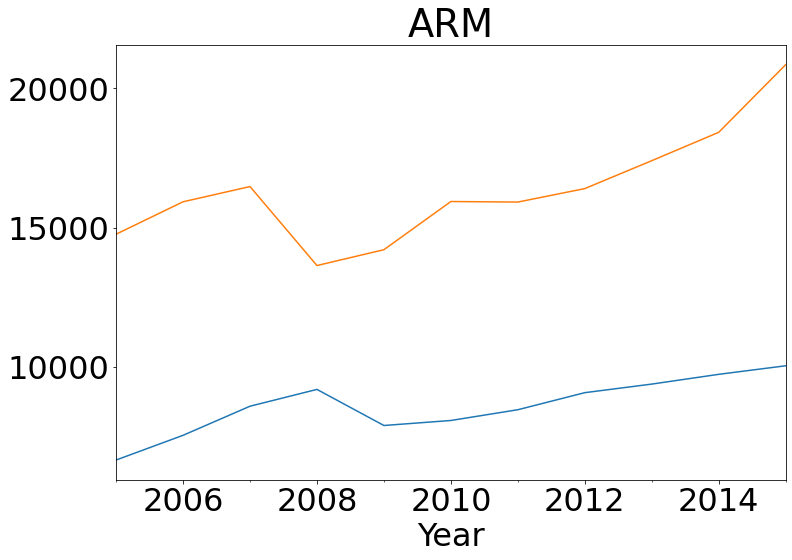

...

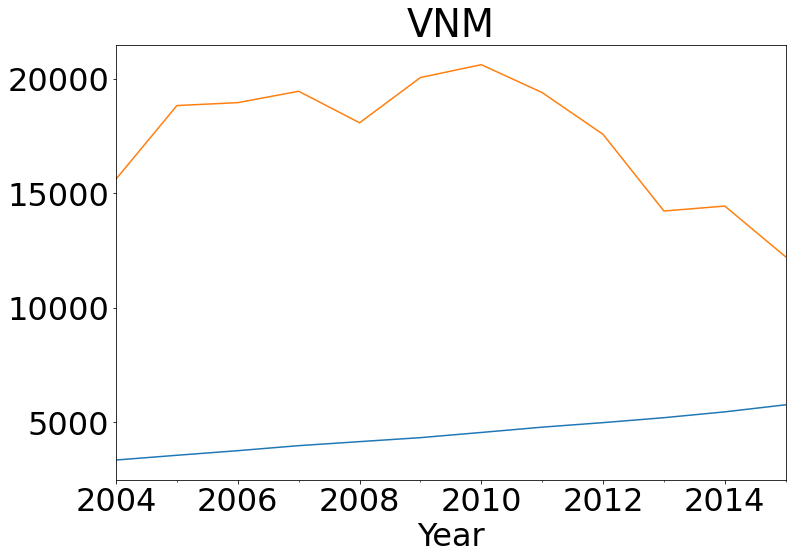

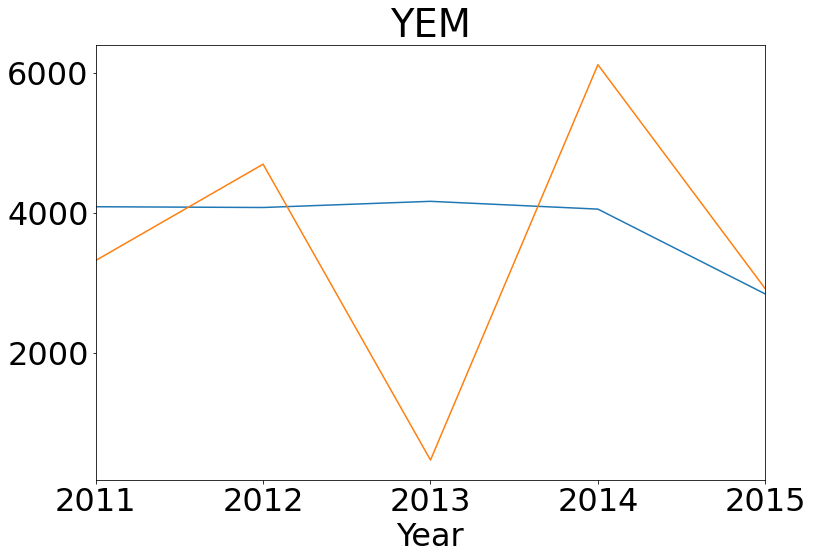

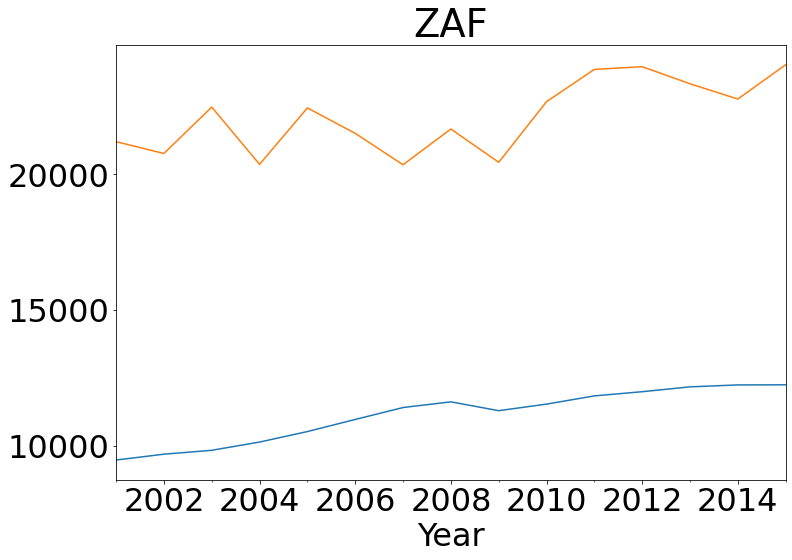

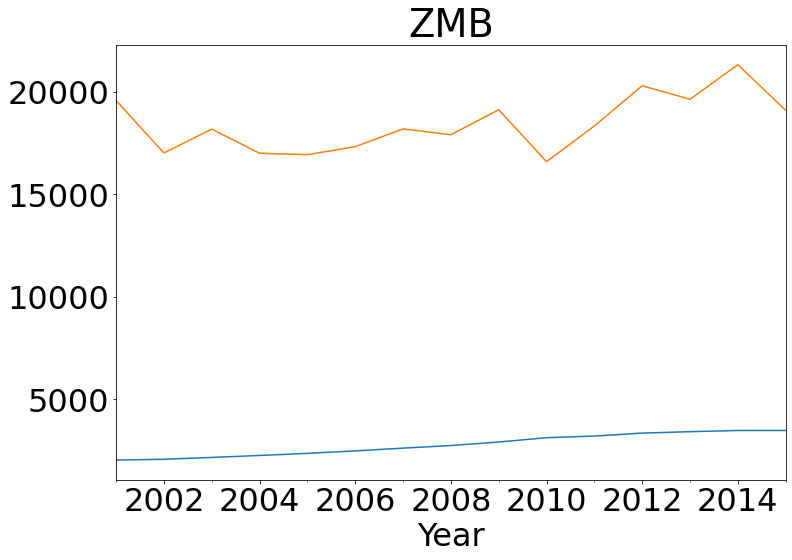

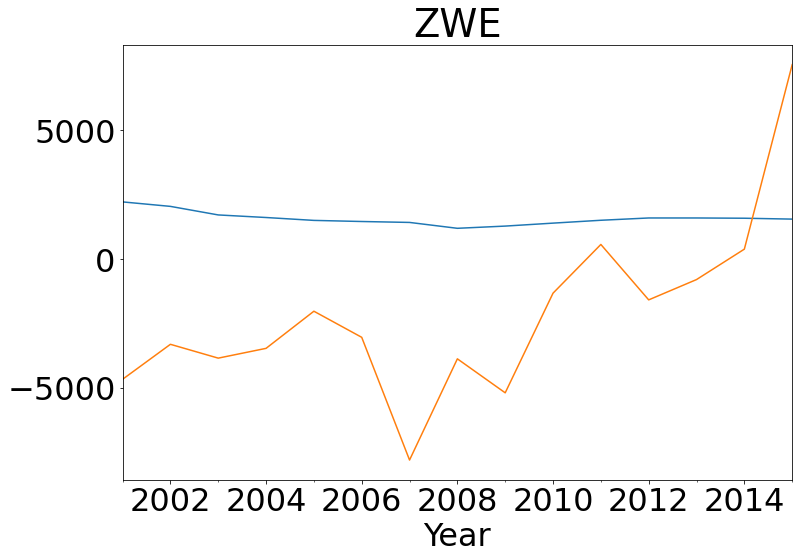

In [24]:
countries = data.groupby("ISO_Code").mean().index
for country in countries:
    fig, ax = plt.subplots(figsize = (12,8))
    reg_data[y_var + [y_var[0] + " Predictor"]].loc[country].plot.line(ax = ax,
                                                                       legend = False)    
    ax.set_title(country)

In [25]:
reg_data = data
reg_data["RGDP Per Capita"] = data.groupby("ISO_Code")["RGDP Per Capita"].pct_change() 
reg_data["RGDP Per Capita Lag"] = reg_data["RGDP Per Capita"].shift() 
reg_data = reg_data.replace([np.inf, -np.inf], np.nan).dropna(axis = 0, how = "any")
reg_data.loc["USA"]

<ipython-input-25-5bb3531fd236>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["RGDP Per Capita"] = data.groupby("ISO_Code")["RGDP Per Capita"].pct_change()
<ipython-input-25-5bb3531fd236>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["RGDP Per Capita Lag"] = reg_data["RGDP Per Capita"].shift()


,EFW,Size of Government,Legal System & Property Rights,Sound Money,Freedom to trade internationally,Regulation,RGDP Per Capita,RGDP Per Capita Lag
Year,,,,,,,,
2003-01-01,8.454976,7.830378,7.803444,9.815523,8.142189,8.683346,0.019258,0.008479
2004-01-01,8.443225,7.717933,7.767612,9.727209,8.194439,8.808933,0.028309,0.019258
2005-01-01,8.353783,7.706034,7.540888,9.758164,8.063767,8.700063,0.023962,0.028309
2006-01-01,8.318497,7.701156,7.360503,9.655075,8.079715,8.796037,0.016816,0.023962
2007-01-01,8.394524,7.790872,7.447685,9.735613,8.114240,8.884209,0.008160,0.016816
2008-01-01,8.244885,7.496386,7.409211,9.686262,7.998733,8.633830,-0.012298,0.008160
2009-01-01,7.965853,7.147290,7.188374,9.604751,7.723552,8.165299,-0.036260,-0.012298
2010-01-01,7.972577,7.108888,7.143095,9.678239,7.720760,8.211905,0.016800,-0.036260
2011-01-01,7.906265,7.260760,6.957723,9.305630,7.711284,8.295927,0.008281,0.016800


In [26]:
reg_data.corr().round(4)

,EFW,Size of Government,Legal System & Property Rights,Sound Money,Freedom to trade internationally,Regulation,RGDP Per Capita,RGDP Per Capita Lag
EFW,1.0000,0.2596,0.8047,0.8534,0.8941,0.8090,-0.0056,-0.0141
Size of Government,0.2596,1.0000,-0.1658,0.1069,0.1457,0.0861,0.1061,0.1067
Legal System & Property Rights,0.8047,-0.1658,1.0000,0.5955,0.6708,0.6623,-0.0297,-0.0252
Sound Money,0.8534,0.1069,0.5955,1.0000,0.7628,0.5706,-0.0516,-0.0459
Freedom to trade internationally,0.8941,0.1457,0.6708,0.7628,1.0000,0.6711,-0.0085,-0.0321
Regulation,0.8090,0.0861,0.6623,0.5706,0.6711,1.0000,-0.0071,-0.0362
RGDP Per Capita,-0.0056,0.1061,-0.0297,-0.0516,-0.0085,-0.0071,1.0000,0.4372
RGDP Per Capita Lag,-0.0141,0.1067,-0.0252,-0.0459,-0.0321,-0.0362,0.4372,1.0000


In [27]:
y_var = ["RGDP Per Capita"]
x_vars = ["Size of Government", 
          "Legal System & Property Rights", 
          "Sound Money",
          "Freedom to trade internationally",
          "Regulation",
          "RGDP Per Capita Lag"]

y = reg_data[y_var]
X = reg_data[x_vars]
X["Constant"] =1
results = sm.OLS(y, X).fit()
reg_data["Predictor"] = results.predict()

<ipython-input-27-f64bf23f2089>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["Constant"] =1


In [28]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        RGDP Per Capita   R-squared:                       0.198
Model:                            OLS   Adj. R-squared:                  0.195
Method:                 Least Squares   F-statistic:                     69.79
Date:                Tue, 26 Oct 2021   Prob (F-statistic):           7.75e-78
Time:                        20:15:35   Log-Likelihood:                 3185.8
No. Observations:                1703   AIC:                            -6358.
Df Residuals:                    1696   BIC:                            -6320.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Size of Government                   0.0022      0.001      2.436      0.015       0.000       0.004
Legal System & Property Rights      -0.0002      0.001     -0.239      0.811      -0.002       0.001
Sound Money                         -0.0024      0.001     -2.533      0.011      -0.004      -0.001
Freedom to trade internationally     0.0019      0.001      1.346      0.179      -0.001       0.005
Regulation                           0.0009      0.001      0.705      0.481      -0.002       0.003
RGDP Per Capita Lag                  0.4205      0.021     19.564      0.000       0.378       0.463
Constant                            -0.0005      0.008     -0.060      0.952      -0.016       0.015
==============================================================================
Omnibus:                      679.970   Durbin-Watson:                   2.051
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            15811.493
Skew:                          -1.321   Prob(JB):                         0.00
Kurtosis:                      17.692   Cond. No.                         369.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

<AxesSubplot:ylabel='Frequency'>

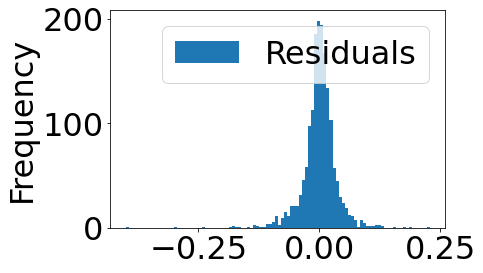

In [29]:
reg_data["Residuals"] = results.resid
fig, ax = plt.subplots(figsize = (6,4))

reg_data[["Residuals"]].plot.hist(bins = 100,
                                  ax = ax)

In [30]:
betaEstimates = results.params
tStats = results.tvalues
pValues = results.pvalues
stdErrors = results.bse

resultsDict = {"Beta Estimates" : betaEstimates,
              "t-stats":tStats,
              "p-values":pValues,
              "Standard Errors":stdErrors}
resultsDF = pd.DataFrame(resultsDict)
resultsDF.round(4)

,Beta Estimates,t-stats,p-values,Standard Errors
Size of Government,0.0022,2.4362,0.0149,0.0009
Legal System & Property Rights,-0.0002,-0.2387,0.8114,0.0009
Sound Money,-0.0024,-2.5330,0.0114,0.0010
Freedom to trade internationally,0.0019,1.3459,0.1785,0.0014
Regulation,0.0009,0.7047,0.4811,0.0013
RGDP Per Capita Lag,0.4205,19.5635,0.0000,0.0215
Constant,-0.0005,-0.0600,0.9522,0.0080


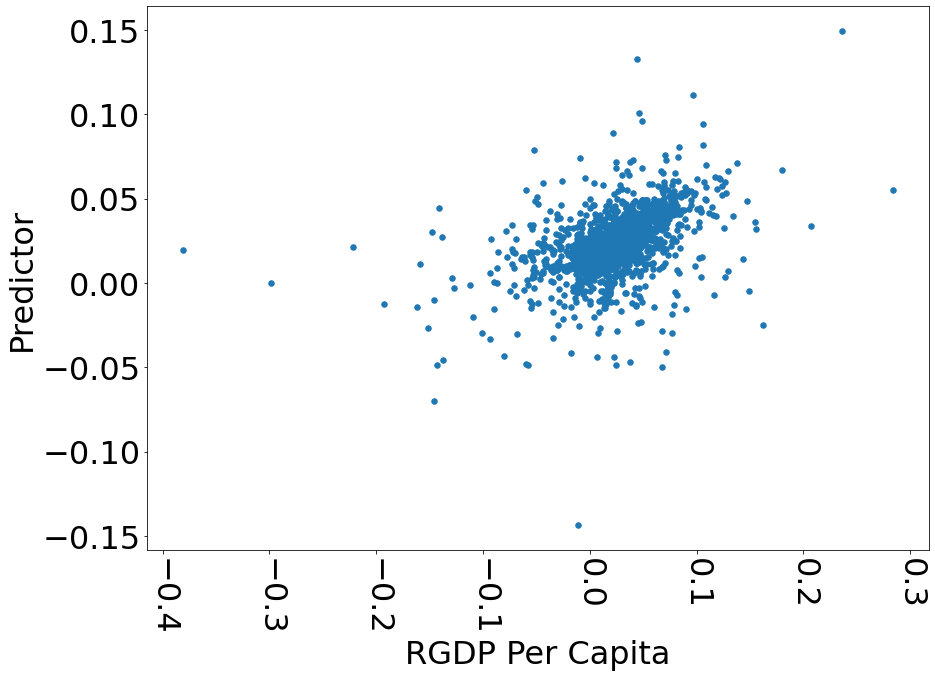

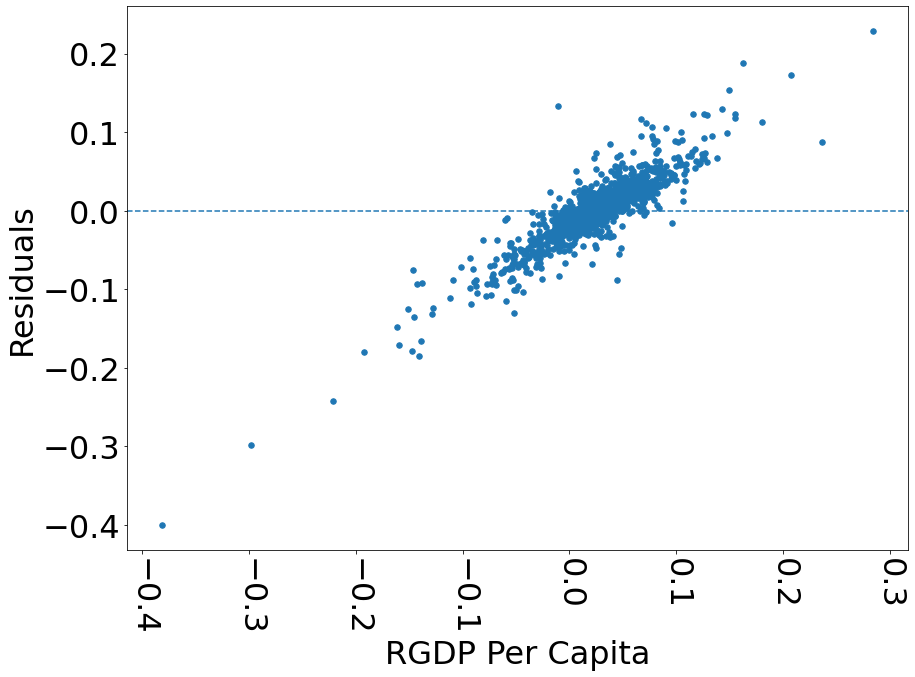

In [31]:
fig, ax = plt.subplots(figsize = (14,10))
reg_data.plot.scatter(x = y_var[0],
                 y = "Predictor", 
                  s = 30,
                      ax = ax)
plt.xticks(rotation = -90)
plt.show()
plt.close()

fig, ax = plt.subplots(figsize = (14,10))
reg_data.plot.scatter(x = y_var[0],
                 y = "Residuals", 
                  s = 30,
                      ax = ax)
ax.axhline(0, ls = "--")
plt.xticks(rotation = -90)
plt.show()
plt.close()

In [32]:
countries = reg_data.groupby("ISO_Code").mean().index
plot_data = reg_data[y_var + ["Predictor"]]
for key in plot_data:
    plot_data[key] = plot_data[key] + 1

plot_data

<ipython-input-32-92c14819f051>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data[key] = plot_data[key] + 1


RGDP Per Capita  Predictor
ISO_Code Year                                  
AGO      2008-01-01         1.106371   1.094108
         2009-01-01         0.995464   1.062137
         2010-01-01         1.005063   1.013032
         2011-01-01         1.009572   1.016454
         2012-01-01         1.021707   1.016097
...                              ...        ...
ZWE      2011-01-01         1.079060   1.054660
         2012-01-01         1.058746   1.046748
         2013-01-01         1.000000   1.034913
         2014-01-01         0.993766   1.008590
         2015-01-01         0.978670   1.007325

[1703 rows x 2 columns]

In [33]:
plot_data.groupby("ISO_Code").cumprod().loc["GBR"][y_var + ["Predictor"]]

,RGDP Per Capita,Predictor
Year,,
2003-01-01,1.029856,1.024274
2004-01-01,1.049891,1.052655
2005-01-01,1.073715,1.076833
2006-01-01,1.092538,1.103071
2007-01-01,1.111754,1.127216
2008-01-01,1.096114,1.149760
2009-01-01,1.040798,1.157134
2010-01-01,1.052437,1.146251
2011-01-01,1.059984,1.165026


<ipython-input-34-81623640cad5>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize = (12,8))


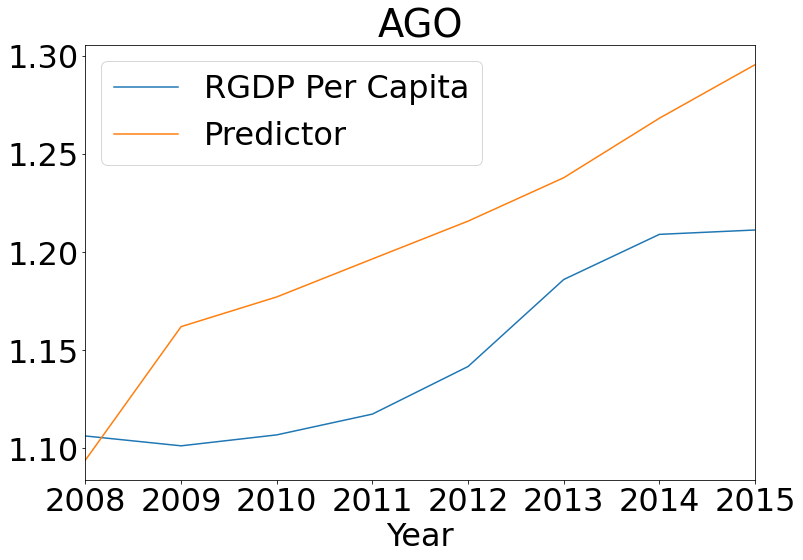

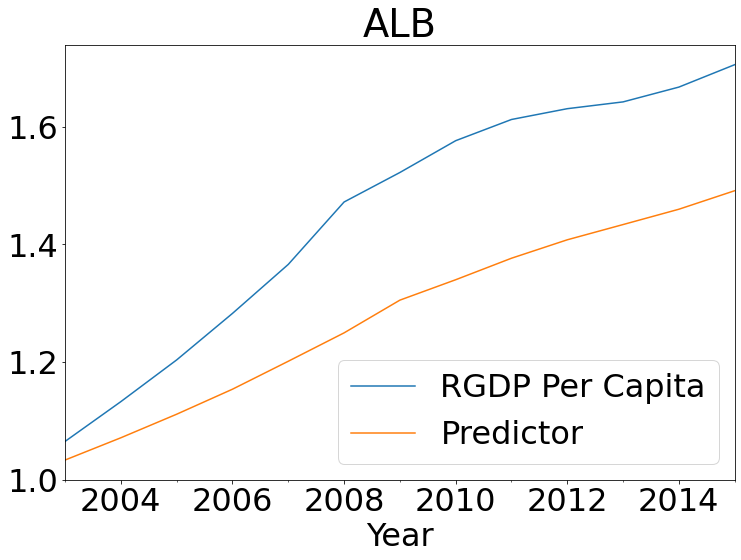

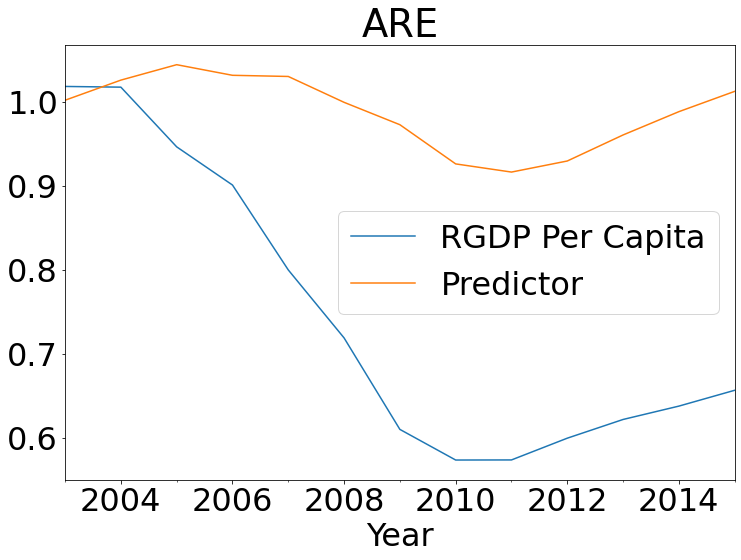

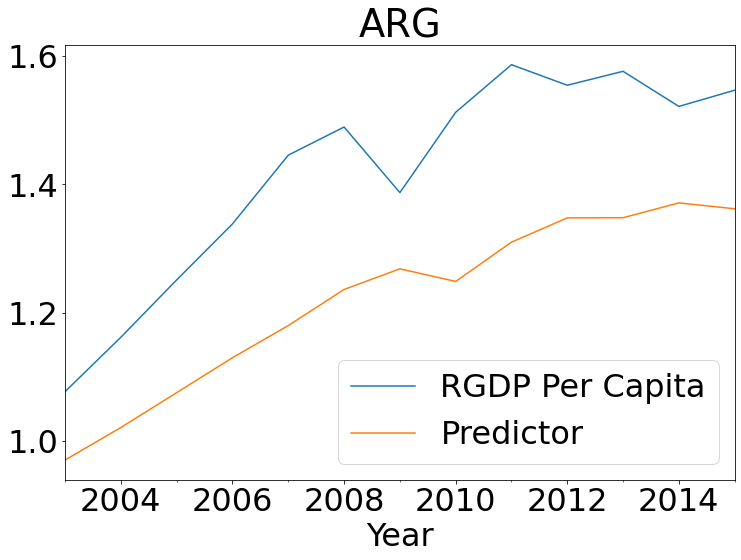

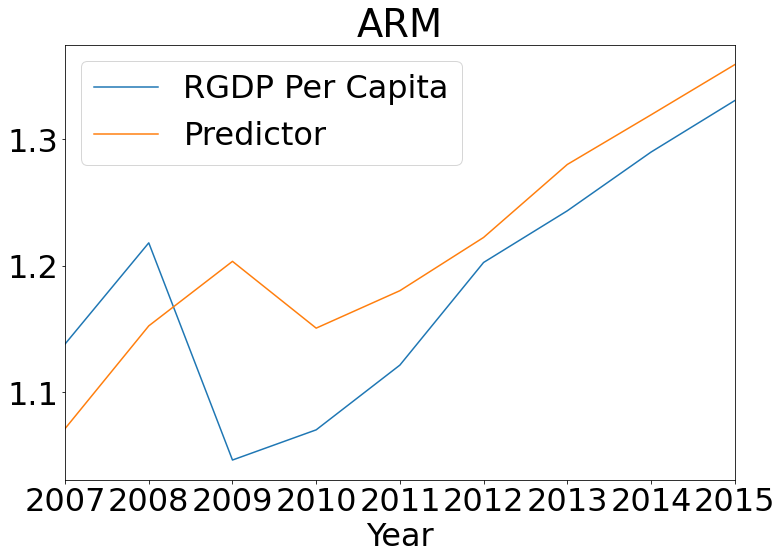

...

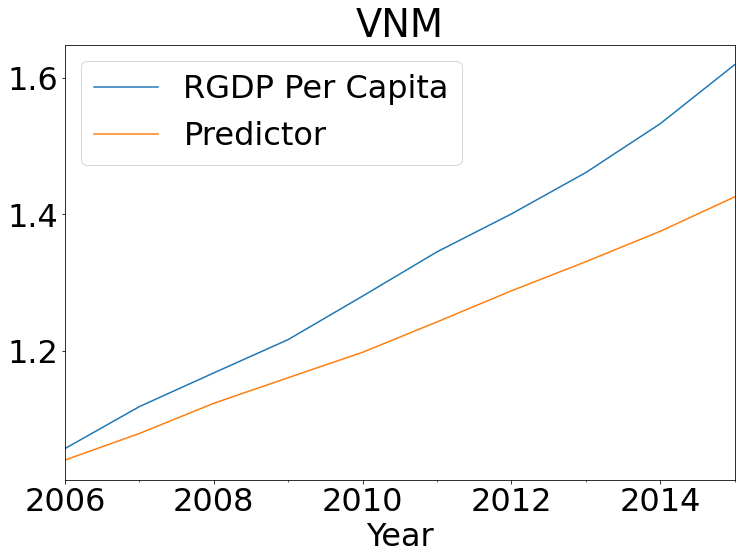

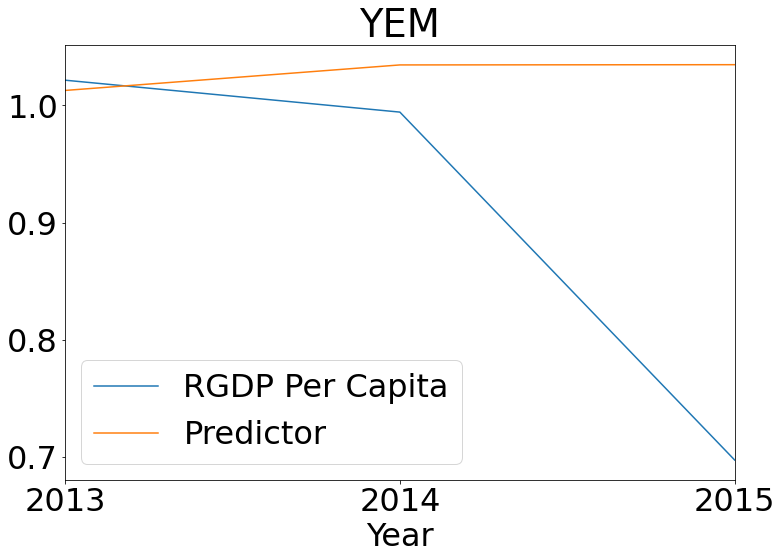

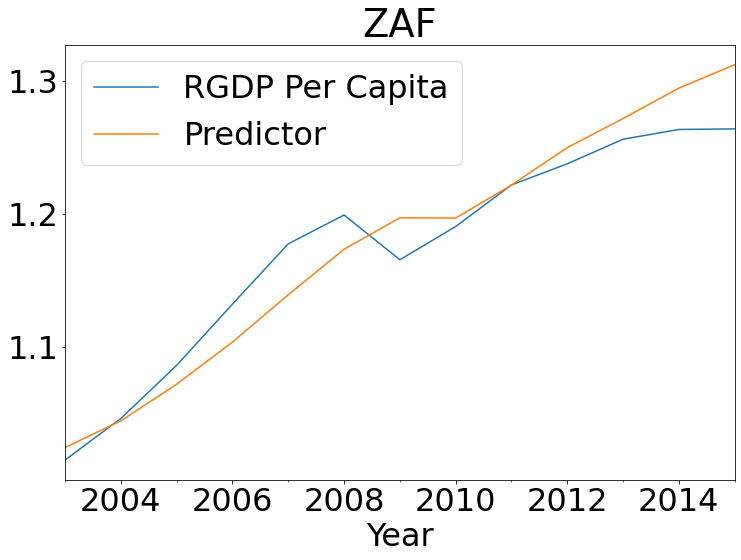

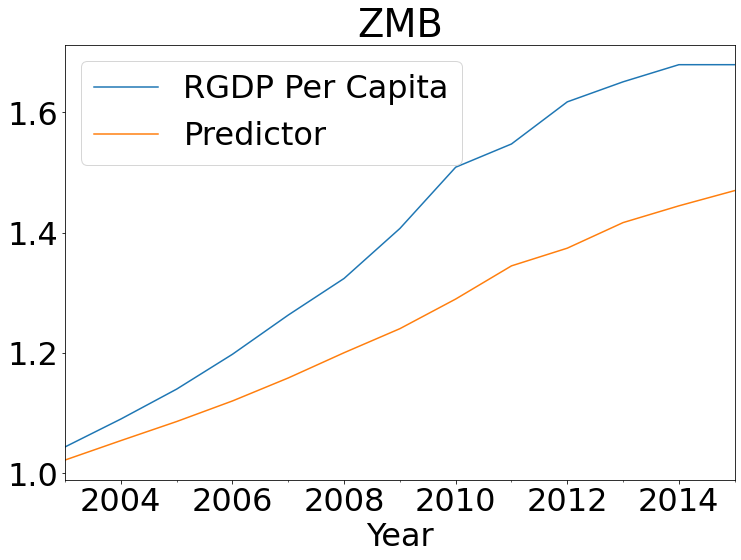

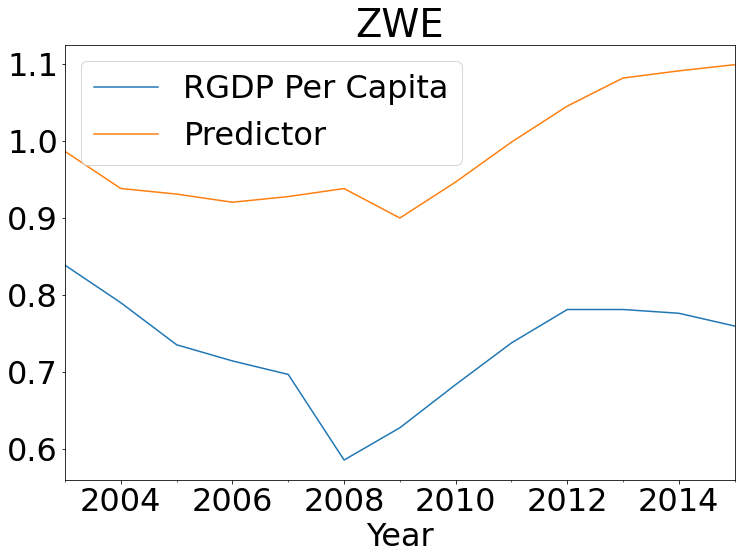

In [34]:
for country in countries:
    fig, ax = plt.subplots(figsize = (12,8))

    plot_data[y_var + ["Predictor"]].loc[country].cumprod().plot.line(ax = ax,
                                                                      legend = True)
    
    ax.set_title(country)
    plt.plot()